<a href="https://colab.research.google.com/github/nextosai/Video-Upscaler-and-Enhancer/blob/main/Guile_Lindroth_Video_Upscaler.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#@title **Video Upscaler by Guile Lindroth**

# Clone CodeFormer and enter the CodeFormer folder
%cd /content
!rm -rf CodeFormer
!git clone https://github.com/cedro3/CodeFormer.git
%cd CodeFormer

# Set up the environment
# Install python dependencies
!pip install -r requirements.txt
# Install basicsr
!python basicsr/setup.py develop

# Download the pre-trained model
!python scripts/download_pretrained_models.py facelib
!python scripts/download_pretrained_models.py CodeFormer

# Define function
from function import *

# make dir
! mkdir download

/content
Cloning into 'CodeFormer'...
remote: Enumerating objects: 418, done.
remote: Counting objects: 100% (171/171), done.
remote: Compressing objects: 100% (60/60), done.
remote: Total 418 (delta 116), reused 111 (delta 111), pack-reused 247 (from 1)
Receiving objects: 100% (418/418), 20.66 MiB | 20.96 MiB/s, done.
Resolving deltas: 100% (166/166), done.
/content/CodeFormer
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.8/46.8 kB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.9/294.9 kB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 69.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 256.2/256.2 kB 17.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.8/53.8 kB 3.6 MB/s eta 0:00:00
/usr/local/lib/python3.10/dist-packages/setuptools/__init__.py:94: _DeprecatedInstaller: setuptools.installer and fetch_build_eggs are deprecated.
!!

        ****************************************************************

In [2]:
#@title **Optional: Link this Notebook to your Google Drive for faster upload your videos**
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


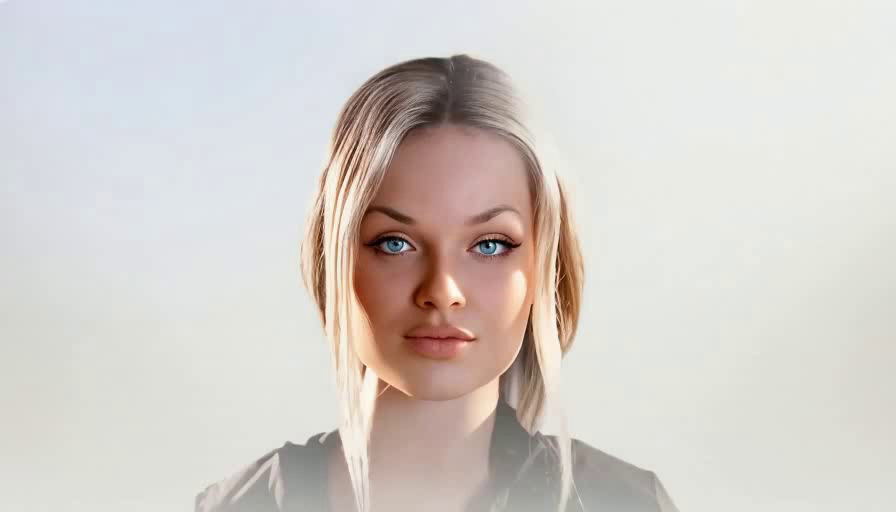

fps =  29.99
frames =  707
interval =  1


In [3]:
#@title **Loading your Video**

#@markdown Please upload the original video with audio (mp4) to the Codeformer/movie folder.
#
#@markdown Please do so within 60 seconds (for 30fps)
#@markdown
#@markdown Type the name of the video in the box bellow. Don't use spaces for the video name.
#@markdown

# Settings
video = 'Aria_Hedra.mp4' #@param {type:"string"}
video_file = 'movie/'+video
image_dir='inputs/frame/'
image_file='%s.png'

# First Convert all video frames to images for the upscale
reset_folder('inputs/frame')
fps, i, interval = video_2_images(video_file, image_dir, image_file)

# Display first Frame
from google.colab.patches import cv2_imshow
img = cv2.imread('inputs/frame/000000.png')
cv2_imshow(img)

# Parameters Display
print('fps = ', fps)
print('frames = ', i)
print('interval = ', interval)

In [4]:
from types import FrameType
#@title **Higher image quality**
#@markdown　Processing time takes about 1 minute for a 1 second (30fps) video
#@markdown Use the dial to increase the likeness of the final video compared to the driven image.

# Settings
input_folder = 'inputs/frame'
w = 0.7 #@param {type:"slider", min:0.1, max:0.9, step:0.1}
reset_folder('results/frame_'+str(w))

# High Quality Frame. We use Realesrgan to improve the background
! python inference_codeformer.py --w $w\
                                  --test_path $input_folder\
                                  --bg_upsampler realesrgan\
                                  --face_upsample

# Clear Logs
clear_output()

# Create the final Video
print('creating final video...')
fps_r = fps/interval
file_path = 'results/frame_'+str(w)+'/final_results/%06d.png'
! ffmpeg -y -r $fps_r -i $file_path -vcodec libx264 -pix_fmt yuv420p -loglevel error out.mp4

# Audio extraction/addition
print('preparation for sound using ffmpeg...')
! ffmpeg -y -i $video_file -loglevel error sound.mp3
! ffmpeg -y -i out.mp4 -i sound.mp3 -loglevel error output.mp4

# 動画の再生
print('waiting for video to play...')
display_mp4('output.mp4')

creating final video...
preparation for sound using ffmpeg...
waiting for video to play...


In [ ]:
#@title **Download Final Upscaled Video**
#@markdown For google chrome only.
#@markdown
#@markdown  Otherwise download the final video by righ clicking on file "output.mp4"
from google.colab import files
import shutil

dst_filepath = 'download/'+os.path.splitext(video)[0]+'_s.mp4'
shutil.copy('output.mp4', dst_filepath)
files.download(dst_filepath)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>